# Best Model Training Session

---

After various experiments we have done in previous notebooks, in this one, run once again on [Colab](https://colab.research.google.com), we are going to perform a long-run training session with what has appeared to us as the best hyperparameters combination with **Detectron2** with our custom use case.

Let's going on!

---

## Detectron2 installation and basic setup

In this section, we are going to adapt the procedure given in the notebook present in [Detectron2](https://github.com/facebookresearch/detectron2) GitHub homepage.

As always, the prerequisite step consists on loading the appropriate packages to perform our work:

In [1]:
# Needed packages:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import json, cv2, random, torch, torchvision, os
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon
from PIL import Image
from utils import rle_to_mask
from google.colab.patches import cv2_imshow

Now, we need to check and get some configuration characteristics:

In [2]:
# Check what GPU is at our disposal in this session:
!nvidia-smi

Tue Aug 25 09:04:45 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.57       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
# Check some configuration characteristics:
print("*** Some configuration characteristics:")
print("- Torch version: {}".format(torch.__version__))
print("- Cuda: {}".format(torch.cuda.is_available()))

*** Some configuration characteristics:
- Torch version: 1.6.0+cu101
- Cuda: True


In [4]:
# Check GCC version:
!gcc --version

gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



We can now begin the core installation process:

In [5]:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions:

# Install dependencies:
!pip install pyyaml==5.1 pycocotools==2.0.1

# Install Detectron2 (Colab has CUDA 10.1 + torch 1.6):
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html


All is OK! We can now move on basic setup of the tool:

In [6]:
# Needed Detectron2 packages:
import detectron2
from detectron2.utils.logger import setup_logger
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data.catalog import Metadata

In [7]:
# Set Detectron2 monitoring:
setup_logger(output='../models/best_model')

<Logger detectron2 (DEBUG)>

---

## Register the datasets

It's now time to register the datasets we have constituted in a previous notebook. As they are custom ones, we need to operate carefully and to follow the instructions given in the [Detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).

In [8]:
# Custom function to register custom dataset:
def get_severstal_dicts(dataset_path):
    """ Get Severstal dictionaries """
    
    # Open CSV description file:
    dataset_file_path = dataset_path + 'annotations.csv'
    dataset = pd.read_csv(dataset_file_path)
    
    # Initialize list of dictionaries for dataset:
    dataset_dicts = []
    
    # Go through dataset:
    for idx, row in dataset.iterrows():
        # Initialize record:
        record = {}
        # Populate first elements of record:
        file_name = dataset_path + row['ImageId']
        width, height = Image.open(file_name).size
        record['file_name'] = file_name
        record['height'] = height
        record['width'] = width
        record['image_id'] = idx
        # Initialize last element of record:
        annotations = []
        # Get mask:
        rle = row['EncodedPixels']
        mask = rle_to_mask(rle)
        # Determine contours:
        contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        # Populate last element of record:
        for contour in contours:
            contour_array = contour.reshape(-1, 2)
            px = [i[0] for i in contour_array]
            py = [j[1] for j in contour_array]
            poly = [(x + 0.5, y + 0.5) for x, y in zip(px, py)]
            poly = [p for x in poly for p in x]
            x0, y0 = int(np.min(px)), int(np.min(py))
            x1, y1 = int(np.max(px)), int(np.max(py))
            if (len(poly)%2)==0 and len(poly)>=6:
                annotation = {'bbox': [x0, y0, x1, y1],
                              'bbox_mode': BoxMode.XYXY_ABS,
                              'segmentation': [poly],
                              'category_id': row['ClassId'] - 1,
                              'iscrowd': 0}
                annotations.append(annotation)
        record['annotations'] = annotations
        # Add to list of dictionaries:
        dataset_dicts.append(record)
    
    # Return results:
    return dataset_dicts

In [9]:
# Set annotations:
severstal_annotations = ['Type 1', 'Type 2', 'Type 3', 'Type 4']

In [10]:
# Register training and testing datasets:
for ds in ['training_ds', 'testing_ds']:
    DatasetCatalog.register(ds, lambda ds=ds: get_severstal_dicts('../data/' + ds + '/'))
    MetadataCatalog.get(ds).set(thing_classes=severstal_annotations)

In [11]:
# Set metadata:
severstal_metadata = Metadata()
severstal_metadata.set(thing_classes=severstal_annotations)

Metadata(thing_classes=['Type 1', 'Type 2', 'Type 3', 'Type 4'])

In [12]:
# Get training and testing datasets dictionaries lists:
training_ds_dicts = get_severstal_dicts('../data/training_ds/')
testing_ds_dicts = get_severstal_dicts('../data/testing_ds/')

In [13]:
# Display random recording:
print('*** A random recording from testing dataset:\n')
print(testing_ds_dicts[2092])

*** A random recording from testing dataset:

{'file_name': '../data/testing_ds/fea8e46ad.jpg', 'height': 256, 'width': 1600, 'image_id': 2092, 'annotations': [{'bbox': [1339, 24, 1353, 255], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1347.5, 24.5, 1346.5, 25.5, 1344.5, 25.5, 1343.5, 26.5, 1341.5, 26.5, 1340.5, 27.5, 1339.5, 27.5, 1339.5, 141.5, 1340.5, 142.5, 1340.5, 255.5, 1353.5, 255.5, 1353.5, 195.5, 1352.5, 194.5, 1352.5, 140.5, 1351.5, 139.5, 1351.5, 107.5, 1350.5, 106.5, 1350.5, 74.5, 1349.5, 73.5, 1349.5, 41.5, 1348.5, 40.5, 1348.5, 24.5]], 'category_id': 2, 'iscrowd': 0}, {'bbox': [1321, 21, 1336, 254], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmentation': [[1321.5, 21.5, 1321.5, 131.5, 1322.5, 132.5, 1322.5, 254.5, 1336.5, 254.5, 1336.5, 226.5, 1335.5, 225.5, 1335.5, 168.5, 1334.5, 167.5, 1334.5, 109.5, 1333.5, 108.5, 1333.5, 51.5, 1332.5, 50.5, 1332.5, 21.5]], 'category_id': 2, 'iscrowd': 0}, {'bbox': [710, 2, 735, 255], 'bbox_mode': <BoxMode.XYXY_ABS: 0>, 'segmenta

To verify the data loading is correct, let's visualize the annotations of randomly selected samples in the testing set:

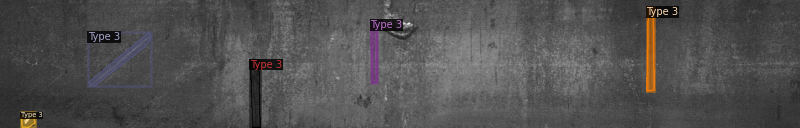

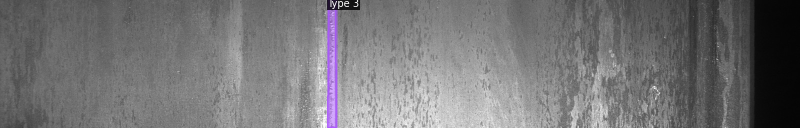

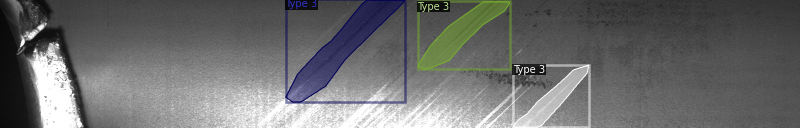

In [14]:
# Some random visualizations:
for recording in random.sample(testing_ds_dicts, 3):
    img = cv2.imread(recording['file_name'])
    visualizer = Visualizer(img[:, :, ::-1],
                            metadata=severstal_metadata,
                            scale=0.5)
    out = visualizer.draw_dataset_dict(recording)
    cv2_imshow(out.get_image()[:, :, ::-1])

---

## Perform training

Now that our custom datasets have been correctly loaded, we are going to run a training.

For that, we are going to begin setting up the configuration of the tool:

In [15]:
# See https://detectron2.readthedocs.io/modules/config.html for more information

# Detectron2 custom (and very basic) configuration:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'))
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url('COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml')
cfg.DATASETS.TRAIN = ('training_ds',)
cfg.DATASETS.TEST = ('testing_ds',)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025
cfg.SOLVER.MAX_ITER = 50000
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
cfg.TEST.EVAL_PERIOD = 0
cfg.OUTPUT_DIR = '../models/best_model/training'

We can now run the training:

In [16]:
# Define trainer:
class MyTrainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = '../models/best_model/training'
        return COCOEvaluator(dataset_name, cfg, True, output_folder)

# Set trainer:
trainer = MyTrainer(cfg) 
trainer.resume_or_load(resume=False)

# Perform training:
trainer.train()

[08/25 09:09:05 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:02, 71.0MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[08/25 09:09:34 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/structures/masks.py:331: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:766.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.6/dist-packages/detectron2/layers/wrappers.py:226: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_

[08/25 09:09:38 d2.utils.events]:  eta: 2:46:11  iter: 19  total_loss: 3.390  loss_cls: 1.407  loss_box_reg: 0.374  loss_mask: 0.693  loss_rpn_cls: 0.949  loss_rpn_loc: 0.105  time: 0.2007  data_time: 0.0151  lr: 0.000050  max_mem: 1179M
[08/25 09:09:42 d2.utils.events]:  eta: 2:47:55  iter: 39  total_loss: 2.081  loss_cls: 0.620  loss_box_reg: 0.440  loss_mask: 0.685  loss_rpn_cls: 0.147  loss_rpn_loc: 0.145  time: 0.2014  data_time: 0.0056  lr: 0.000100  max_mem: 1179M
[08/25 09:09:46 d2.utils.events]:  eta: 2:49:20  iter: 59  total_loss: 1.683  loss_cls: 0.409  loss_box_reg: 0.455  loss_mask: 0.657  loss_rpn_cls: 0.111  loss_rpn_loc: 0.080  time: 0.2032  data_time: 0.0058  lr: 0.000150  max_mem: 1236M
[08/25 09:09:51 d2.utils.events]:  eta: 2:49:29  iter: 79  total_loss: 1.764  loss_cls: 0.406  loss_box_reg: 0.502  loss_mask: 0.637  loss_rpn_cls: 0.104  loss_rpn_loc: 0.075  time: 0.2034  data_time: 0.0048  lr: 0.000200  max_mem: 1236M
[08/25 09:09:55 d2.utils.events]:  eta: 2:49:32 

In [17]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir ../models/best_model/training

<IPython.core.display.Javascript object>

---

## Evaluate trained model

Now that we have performed the training, we can evaluate our model performance using AP metric implemented in COCO API:

In [18]:
# Model evaluation:
evaluator = COCOEvaluator('testing_ds',
                          cfg,
                          False,
                          output_dir='../models/best_model/testing/')
testing_loader = build_detection_test_loader(cfg, 'testing_ds')
print(inference_on_dataset(trainer.model, testing_loader, evaluator))

[08/25 12:29:39 d2.data.common]: Serializing 2104 elements to byte tensors and concatenating them all ...
[08/25 12:29:40 d2.data.common]: Serialized dataset takes 19.11 MiB
[08/25 12:29:40 d2.data.dataset_mapper]: Augmentations used in training: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[08/25 12:29:40 d2.evaluation.evaluator]: Start inference on 2104 images
[08/25 12:29:42 d2.evaluation.evaluator]: Inference done 11/2104. 0.0543 s / img. ETA=0:02:17
[08/25 12:29:47 d2.evaluation.evaluator]: Inference done 84/2104. 0.0558 s / img. ETA=0:02:18
[08/25 12:29:52 d2.evaluation.evaluator]: Inference done 158/2104. 0.0563 s / img. ETA=0:02:12
[08/25 12:29:57 d2.evaluation.evaluator]: Inference done 232/2104. 0.0565 s / img. ETA=0:02:07
[08/25 12:30:02 d2.evaluation.evaluator]: Inference done 303/2104. 0.0567 s / img. ETA=0:02:03
[08/25 12:30:07 d2.evaluation.evaluator]: Inference done 376/2104. 0.0568 s / img. ETA=0:01:58
[08/25 12:30:12 d2.eval

---

## Run inferences with trained model

Now we have evaluate our best model performances, to conclude this notebook, we can run some inferences with it, to check principally how long it takes to perform inference and how it acts with submitted images.

In [19]:
# Build predicor:
cfg.MODEL.WEIGHTS = '../models/best_model/training/model_final.pth'
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)

### Inference time

In [20]:
# Get all image in testing dataset:
testing_ds_imgs = []
for element in os.listdir('../data/testing_ds'):
    if element.split('.')[-1] == 'jpg':
        testing_ds_imgs.append(element)

# Check if all has been OK:
print("*** Quick check:")
print("- Testing dataset counts {} images.".format(len(testing_ds_imgs)))
print("- One example of image in this dataset is '{}'.".format(testing_ds_imgs[42]))

*** Quick check:
- Testing dataset counts 1675 images.
- One example of image in this dataset is 'f1becb8a5.jpg'.


In [21]:
# Build list of images to treat:
inference_images_lst = []
for element in testing_ds_imgs:
    img_path = '../data/testing_ds/' + element
    img = cv2.imread(img_path)
    inference_images_lst.append(img)

In [22]:
# Check how long it takes to perform inference on all testing dataset:
%%time
for element in inference_images_lst:
    outputs = predictor(element)

CPU times: user 1min 19s, sys: 22.2 s, total: 1min 41s
Wall time: 1min 41s


### Inference on images

In [23]:
# Pick up ten random recordings on training dataset:
random_training = random.sample(training_ds_dicts, 10)

*** Original image with its labeled defects:


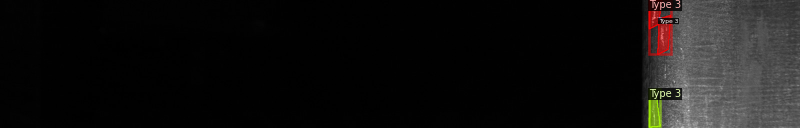

*** Model prediction:


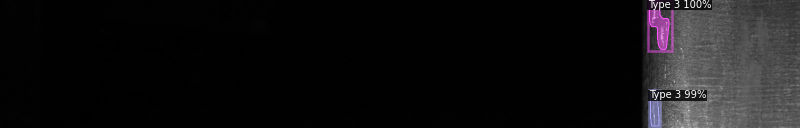

In [25]:
# First random prediction:
img = cv2.imread(random_training[0]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[0])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


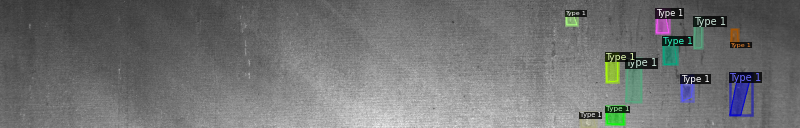

*** Model prediction:


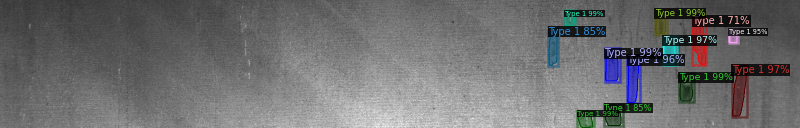

In [26]:
# Second random prediction:
img = cv2.imread(random_training[1]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[1])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


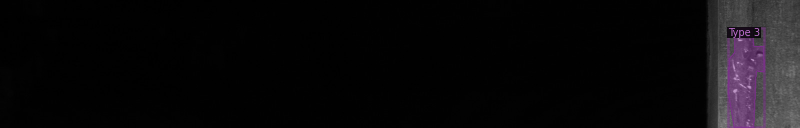

*** Model prediction:


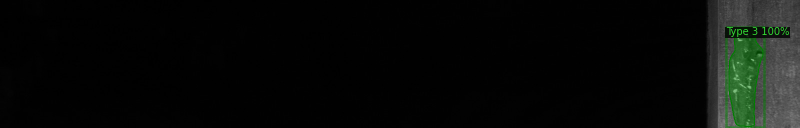

In [27]:
# Third random prediction:
img = cv2.imread(random_training[2]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[2])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


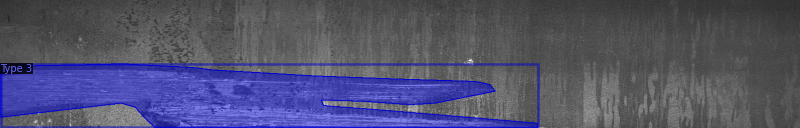

*** Model prediction:


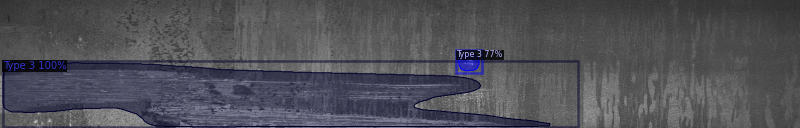

In [28]:
# Fourth random prediction:
img = cv2.imread(random_training[3]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[3])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


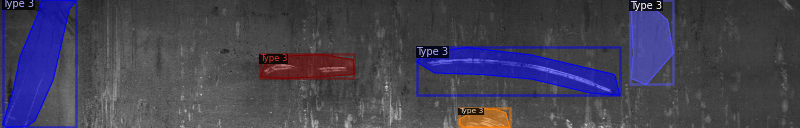

*** Model prediction:


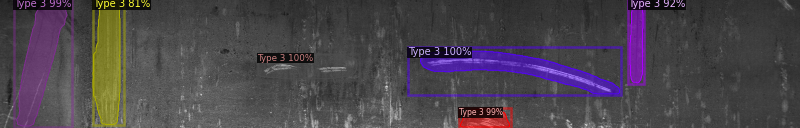

In [29]:
# Fifth random prediction:
img = cv2.imread(random_training[4]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[4])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


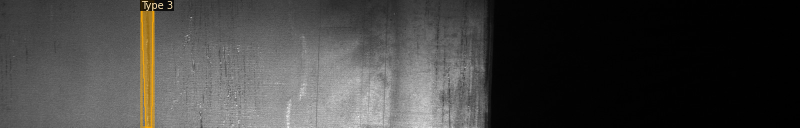

*** Model prediction:


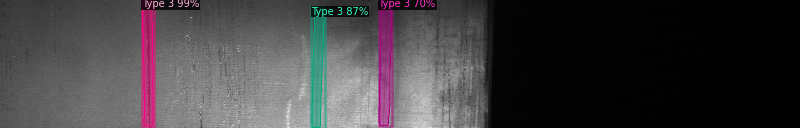

In [30]:
# Sixth random prediction:
img = cv2.imread(random_training[5]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[5])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


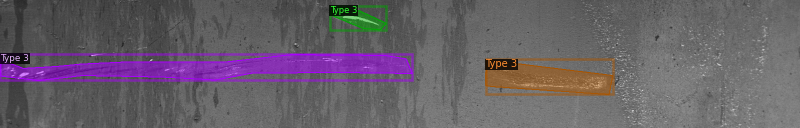

*** Model prediction:


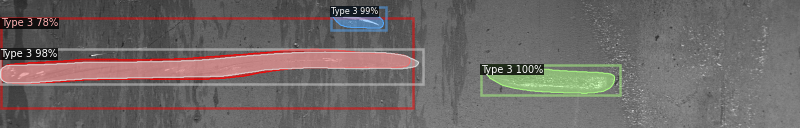

In [31]:
# Seventh random prediction:
img = cv2.imread(random_training[6]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[6])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


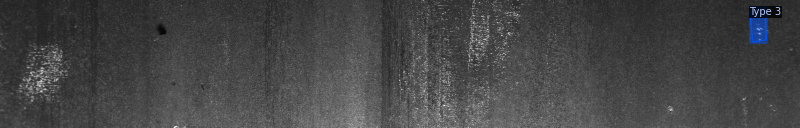

*** Model prediction:


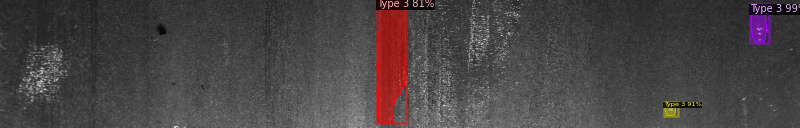

In [32]:
# Eight random prediction:
img = cv2.imread(random_training[7]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[7])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


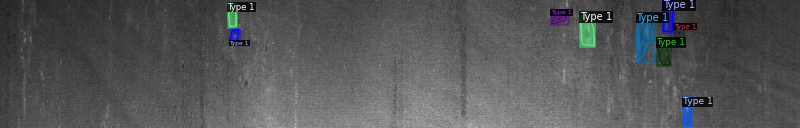

*** Model prediction:


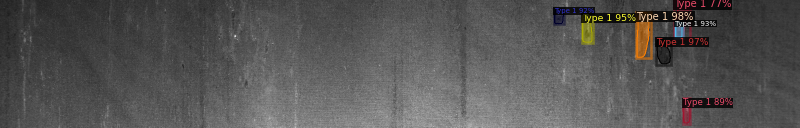

In [33]:
# Ninth random prediction:
img = cv2.imread(random_training[8]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[8])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

*** Original image with its labeled defects:


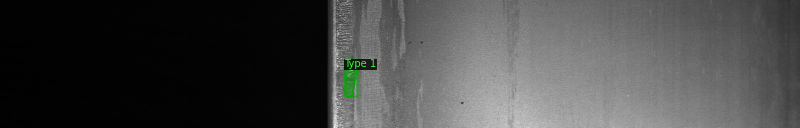

*** Model prediction:


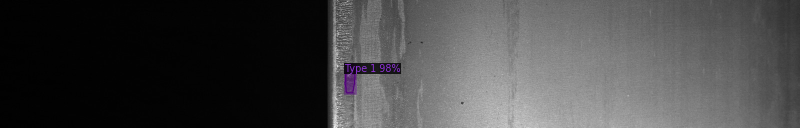

In [34]:
# Tenth random prediction:
img = cv2.imread(random_training[9]['file_name'])

print('*** Original image with its labeled defects:')
visualizer = Visualizer(img[:, :, ::-1],
                        metadata=severstal_metadata,
                        scale=0.5)
out = visualizer.draw_dataset_dict(random_training[9])
cv2_imshow(out.get_image()[:, :, ::-1])

print('*** Model prediction:')
outputs = predictor(img)
visualizer_pred = Visualizer(img[:, :, ::-1],
                             metadata=severstal_metadata,
                             scale=0.5)
pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
cv2_imshow(pred.get_image()[:, :, ::-1])

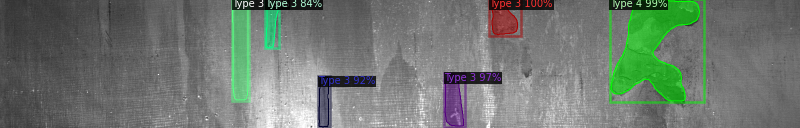

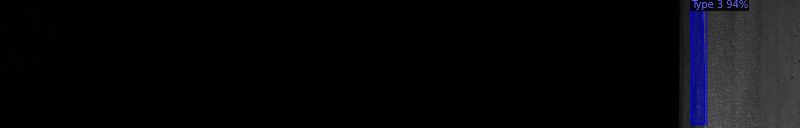

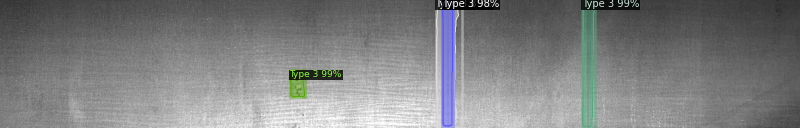

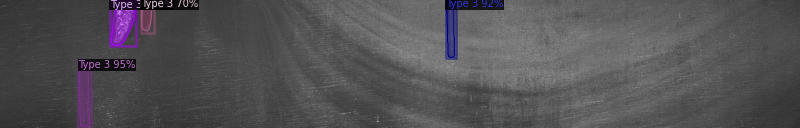

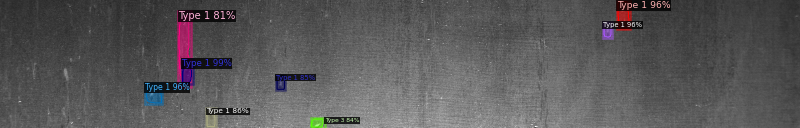

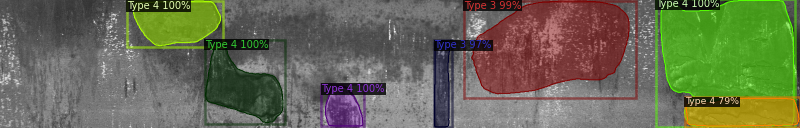

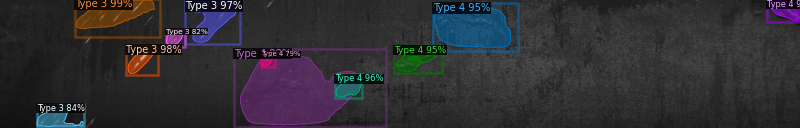

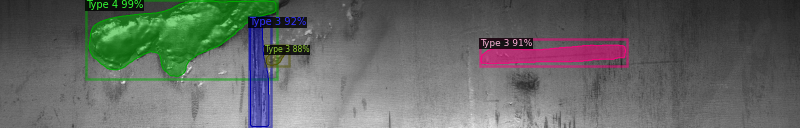

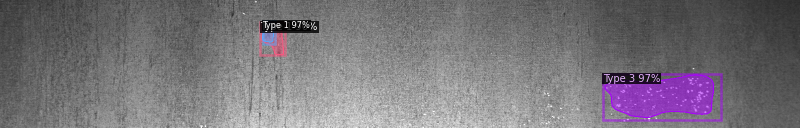

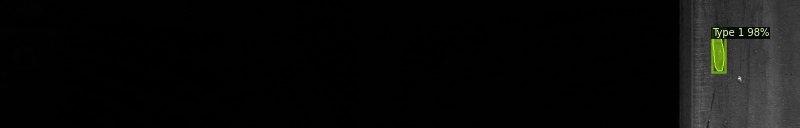

In [36]:
# Random predictions on testing dataset:
for recording in random.sample(testing_ds_dicts, 10):
    img = cv2.imread(recording['file_name'])
    outputs = predictor(img)
    visualizer_pred = Visualizer(img[:, :, ::-1],
                                 metadata=severstal_metadata,
                                 scale=0.5)
    pred = visualizer_pred.draw_instance_predictions(outputs['instances'].to('cpu'))
    cv2_imshow(pred.get_image()[:, :, ::-1])